# **RA1: data**

Dong Gyun Ko <br/>
last updated: september 18, 2022 <br/>

In [33]:
# import libraries

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.pylab as plt
import datetime as dt
import os
import warnings
import requests # python 3.6

import statsmodels.api as sm
from statsmodels.tsa.seasonal import STL

import pandas_datareader as pdr
import pandas_datareader.data as web
from pandas_datareader import wb
from pandas_datareader.data import DataReader

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [34]:
# set the working directory

os.chdir('/content/gdrive/MyDrive/Colab Notebooks/RA1_data')

In [35]:
# set the pandas display option

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

# pd.options.display.max_rows = 100
# pd.options.display.max_columns = 100

## **1. data**

### **1.1. python code** <br/>

In [36]:
# import the panel data

df_q_panel = pd.read_excel('df_q_panel.xlsx')

In [37]:
# select the columns

data = df_q_panel[['country', 'isocode', 'quarter', 
                   'ind_region', 'ind_income', 'ind_oecd', 'ind_g7', 
                   'pds_q_ggdebt', 'pds_q_rggexp', 'pds_q_rgdp', 'pds_q_reer', 'pds_q_ca']]
data = data.rename(columns={'country':'country', 'isocode':'isocode', 'quarter':'quarter',
                            'ind_region':'region', 'ind_income':'income', 'ind_oecd':'oecd', 'ind_g7':'g7',
                            'pds_q_ggdebt':'ggdebt', 'pds_q_rggexp':'ggcon', 'pds_q_rgdp':'gdp', 'pds_q_reer':'reer', 'pds_q_ca':'ca'})

In [38]:
# seasonal adjustment

# classical decomposition

def cd(df):

    seasonal = sm.tsa.seasonal_decompose(df, model='additive', period=4).seasonal

    return df - seasonal

# STL decomposition

def stld(df):

    stl = STL(df, period=4, seasonal=5)
    res = stl.fit()
    seasonal = res.seasonal

    return df - seasonal

# ggdebt
for i in range(0, data['isocode'].unique().shape[0]):
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    globals()['cond_null{}'.format(i+1)] = (globals()['data_isocode{}'.format(i+1)]['ggdebt'].isnull() == True)

    globals()['data_sa{}'.format(i+1)] = globals()['data_isocode{}'.format(i+1)].loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)])]

    data.loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)]), 'ggdebt'] = stld(globals()['data_sa{}'.format(i+1)]['ggdebt'])

# ggcon
for i in range(0, data['isocode'].unique().shape[0]):
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    globals()['cond_null{}'.format(i+1)] = (globals()['data_isocode{}'.format(i+1)]['ggcon'].isnull() == True)

    globals()['data_sa{}'.format(i+1)] = globals()['data_isocode{}'.format(i+1)].loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)])]

    data.loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)]), 'ggcon'] = stld(globals()['data_sa{}'.format(i+1)]['ggcon'])

# gdp
for i in range(0, data['isocode'].unique().shape[0]):
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    globals()['cond_null{}'.format(i+1)] = (globals()['data_isocode{}'.format(i+1)]['gdp'].isnull() == True)

    globals()['data_sa{}'.format(i+1)] = globals()['data_isocode{}'.format(i+1)].loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)])]

    data.loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)]), 'gdp'] = stld(globals()['data_sa{}'.format(i+1)]['gdp'])

# ca
for i in range(0, data['isocode'].unique().shape[0]):
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    globals()['cond_null{}'.format(i+1)] = (globals()['data_isocode{}'.format(i+1)]['ca'].isnull() == True)

    globals()['data_sa{}'.format(i+1)] = globals()['data_isocode{}'.format(i+1)].loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)])]

    data.loc[(globals()['cond_isocode{}'.format(i+1)] & ~globals()['cond_null{}'.format(i+1)]), 'ca'] = stld(globals()['data_sa{}'.format(i+1)]['ca'])

In [39]:
# quarterly dataset

data = data.sort_values(by=['isocode', 'quarter']).reset_index(drop=True)

data

,country,isocode,quarter,region,income,oecd,g7,ggdebt,ggcon,gdp,reer,ca
0,Argentina,ARG,1950Q1,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Argentina,ARG,1950Q2,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Argentina,ARG,1950Q3,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Argentina,ARG,1950Q4,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Argentina,ARG,1951Q1,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
14495,South Africa,ZAF,2021Q2,5,2,NaN,NaN,70.88,223698443352.74,1165743462187.47,80.20,5.04
14496,South Africa,ZAF,2021Q3,5,2,NaN,NaN,70.73,223959202009.14,1124134900926.21,78.67,2.39
14497,South Africa,ZAF,2021Q4,5,2,NaN,NaN,71.31,224091595830.67,1125566644987.62,75.72,3.02
14498,South Africa,ZAF,2022Q1,5,2,NaN,NaN,NaN,225833007897.79,1137366344106.18,76.99,2.61


### **1.2. var. summary** <br/>

| |variable|abbreviation|unit|frequency|measure|source|
|-|--------|------------|----|---------|-------|------|
|1|region indicator|region|-|-|EAS: 1, SAS: 2, ECS: 3, MEA: 4, SSF: 5, NAC: 6, LCN: 7|World Bank|
|2|income indicator|income|-|-|HIC: 1, UMC: 2, LMC: 3, LIC: 4|World Bank|
|3|oecd indicator|oecd|-|-|OED: 1|World Bank|
|4|g7 indicator|g7|-|-|G7: 1|World Bank|
|5|general government debt|ggdebt|% of GDP|quarterly|SA by STL|BIS, World Bank, Eurostat|
|6|general government consumption, real|ggcon|DCU|quarterly|real / SA by STL|IMF, FRED|
|7|gross domestic product, real|gdp|DCU|quarterly|real / SA by STL|IMF|
|8|real effective exchange rate|reer|index|quarterly|real|BIS, IMF|
|9|current account balance|ca|% of GDP|quarterly|SA by STL|OECD, FRED|

### **1.3. data summary**

In [40]:
# number of countries & sample period

print('number of countries:', data['isocode'].unique().shape[0])
print(data['isocode'].unique())
print('start:', np.min(data['quarter'].unique()))
print('end:', np.max(data['quarter'].unique()))

number of countries: 50
['ARG' 'AUS' 'AUT' 'BEL' 'BGR' 'BRA' 'CAN' 'CHE' 'CHL' 'COL' 'CYP' 'CZE'
 'DEU' 'DNK' 'ESP' 'EST' 'FIN' 'FRA' 'GBR' 'GRC' 'HKG' 'HRV' 'HUN' 'IDN'
 'IND' 'IRL' 'ISR' 'ITA' 'JPN' 'KOR' 'LTU' 'LUX' 'LVA' 'MEX' 'MLT' 'NLD'
 'NOR' 'NZL' 'POL' 'PRT' 'ROU' 'RUS' 'SGP' 'SVK' 'SVN' 'SWE' 'THA' 'TUR'
 'USA' 'ZAF']
start: 1950Q1
end: 2022Q2


In [41]:
# non-null count by each variables

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14500 entries, 0 to 14499
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   country  14500 non-null  object 
 1   isocode  14500 non-null  object 
 2   quarter  14500 non-null  object 
 3   region   14500 non-null  int64  
 4   income   14500 non-null  int64  
 5   oecd     10440 non-null  float64
 6   g7       2030 non-null   float64
 7   ggdebt   5587 non-null   float64
 8   ggcon    6442 non-null   float64
 9   gdp      6389 non-null   float64
 10  reer     7591 non-null   float64
 11  ca       5313 non-null   float64
dtypes: float64(7), int64(2), object(3)
memory usage: 1.3+ MB


In [42]:
# descriptive statistics

pd.options.display.float_format = '{:.2f}'.format
round(data[['ggdebt', 'ggcon', 'gdp', 'reer', 'ca']].describe(), 2)

,ggdebt,ggcon,gdp,reer,ca
count,5587.00,6442.00,6389.00,7591.00,5313.00
mean,55.96,4532532484647.42,38866750643511.48,97.43,-0.38
std,34.45,21624065103603.47,234588086412315.84,19.10,4.81
min,3.68,29940.86,1309589293.37,32.42,-47.76
25%,31.79,10819697477.85,55490076984.74,89.78,-3.06
50%,48.33,53732045822.35,267664960565.15,97.94,-0.70
75%,71.94,194813015692.21,768761357303.61,103.85,2.19
max,227.18,251067293692856.72,2896892682330297.50,281.92,30.22


## **2. count the data**

### **2.1. ggdebt** <br/>

In [43]:
# generate the count matrix for each country's quarterly data (ggdebt)

for i in range(0, df_q_panel['isocode'].unique().shape[0]):
  
    globals()['cond_isocode_{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['df_isocode_{}'.format(i+1)] = data.loc[globals()['cond_isocode_{}'.format(i+1)]]
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_{}'.format(i+1)].groupby(globals()['df_isocode_{}'.format(i+1)]['quarter']).count()

    globals()['cond_ggdebt_{}'.format(i+1)] = (globals()['df_isocode_count_T_{}'.format(i+1)]['ggdebt'] == 0)
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_count_T_{}'.format(i+1)].loc[~globals()['cond_ggdebt_{}'.format(i+1)]]
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_count_T_{}'.format(i+1)].reset_index()

    print('country', data['country'].unique()[i])
    print('isocode', data['isocode'].unique()[i])
    print('start:', globals()['df_isocode_count_T_{}'.format(i+1)]['quarter'].unique().min())
    print('end:', globals()['df_isocode_count_T_{}'.format(i+1)]['quarter'].unique().max())
    print('obs.:', globals()['df_isocode_count_T_{}'.format(i+1)]['ggdebt'].count())
    print('des. stat.', globals()['df_isocode_{}'.format(i+1)]['ggdebt'].describe())
    print('')

country Argentina
isocode ARG
start: 1992Q4
end: 2021Q4
obs.: 117
des. stat. count   117.00
mean     63.10
std      31.45
min      26.10
25%      38.77
50%      53.95
75%      84.72
max     157.87
Name: ggdebt, dtype: float64

country Australia
isocode AUS
start: 1988Q2
end: 2021Q4
obs.: 135
des. stat. count   135.00
mean     24.97
std      11.41
min       8.32
25%      15.30
50%      24.44
75%      33.04
max      55.08
Name: ggdebt, dtype: float64

country Austria
isocode AUT
start: 2000Q1
end: 2022Q1
obs.: 89
des. stat. count   89.00
mean    76.37
std      6.44
min     65.63
25%     69.70
50%     74.76
75%     82.56
max     87.11
Name: ggdebt, dtype: float64

country Belgium
isocode BEL
start: 1995Q1
end: 2021Q4
obs.: 108
des. stat. count   108.00
mean    108.68
std      11.05
min      89.29
25%     102.32
50%     107.13
75%     112.08
max     134.79
Name: ggdebt, dtype: float64

country Bulgaria
isocode BGR
start: 2000Q1
end: 2022Q1
obs.: 89
des. stat. count   89.00
mean    28.94
st

### **3.2. ggcon** <br/>

In [44]:
# generate the count matrix for each country's quarterly data  (ggexp)

for i in range(0, df_q_panel['isocode'].unique().shape[0]):
  
    globals()['cond_isocode_{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['df_isocode_{}'.format(i+1)] = data.loc[globals()['cond_isocode_{}'.format(i+1)]]
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_{}'.format(i+1)].groupby(globals()['df_isocode_{}'.format(i+1)]['quarter']).count()

    globals()['cond_ggcon_{}'.format(i+1)] = (globals()['df_isocode_count_T_{}'.format(i+1)]['ggcon'] == 0)
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_count_T_{}'.format(i+1)].loc[~globals()['cond_ggcon_{}'.format(i+1)]]
    globals()['df_isocode_count_T_{}'.format(i+1)] = globals()['df_isocode_count_T_{}'.format(i+1)].reset_index()

    print('country', data['country'].unique()[i])
    print('isocode', data['isocode'].unique()[i])
    print('start:', globals()['df_isocode_count_T_{}'.format(i+1)]['quarter'].unique().min())
    print('end:', globals()['df_isocode_count_T_{}'.format(i+1)]['quarter'].unique().max())
    print('obs.:', globals()['df_isocode_count_T_{}'.format(i+1)]['ggcon'].count())
    print('des. stat.', globals()['df_isocode_{}'.format(i+1)]['ggcon'].describe())
    print('')

country Argentina
isocode ARG
start: 2004Q1
end: 2022Q1
obs.: 73
des. stat. count            73.00
mean    20452812392.30
std      3571145245.95
min     13033694825.83
25%     17490165308.69
50%     21576512401.71
75%     23560151173.85
max     24855464029.54
Name: ggcon, dtype: float64

country Australia
isocode AUS
start: 1959Q3
end: 2022Q1
obs.: 251
des. stat. count            251.00
mean     45310832720.70
std      27136912325.94
min       9692321635.47
25%      23269698636.00
50%      39958599533.10
75%      64932293770.32
max     117995575822.65
Name: ggcon, dtype: float64

country Austria
isocode AUT
start: 1995Q1
end: 2022Q2
obs.: 110
des. stat. count           110.00
mean    14407493150.62
std      1704250862.70
min     11525774176.08
25%     12820434188.61
50%     14881143402.53
75%     15533737776.76
max     18363273149.89
Name: ggcon, dtype: float64

country Belgium
isocode BEL
start: 1995Q1
end: 2022Q1
obs.: 109
des. stat. count           109.00
mean    20495126887.28
std 

## **3. plot the data**

In [45]:
# generate the data temp

df_q_panel = pd.read_excel('df_q_panel.xlsx')

data_temp = df_q_panel[['country', 'isocode', 'quarter', 
                        'ind_region', 'ind_income', 'ind_oecd', 'ind_g7', 
                        'pds_q_ggdebt', 'pds_q_rggexp', 'pds_q_rgdp', 'pds_q_reer', 'pds_q_ca']]
data_temp = data_temp.rename(columns={'country':'country', 'isocode':'isocode', 'quarter':'quarter',
                                      'ind_region':'region', 'ind_income':'income', 'ind_oecd':'oecd', 'ind_g7':'g7',
                                      'pds_q_ggdebt':'ggdebt', 'pds_q_rggexp':'ggcon', 'pds_q_rgdp':'gdp', 'pds_q_reer':'reer', 'pds_q_ca':'ca'})

data_temp = data_temp.sort_values(by=['isocode', 'quarter']).reset_index(drop=True)

### **3.1. ggdebt** <br/>

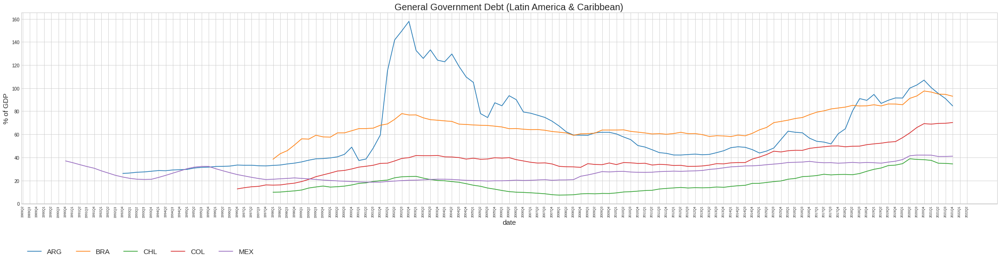

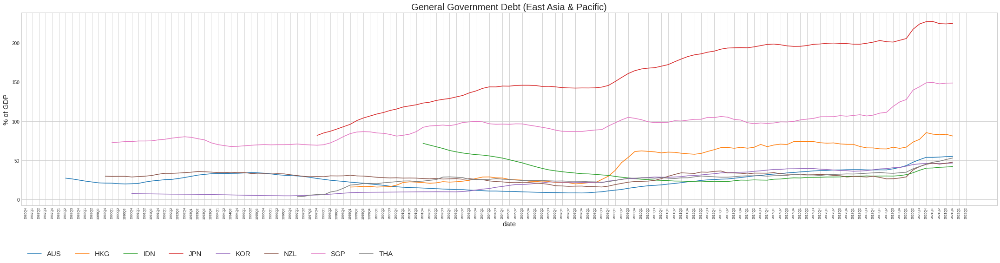

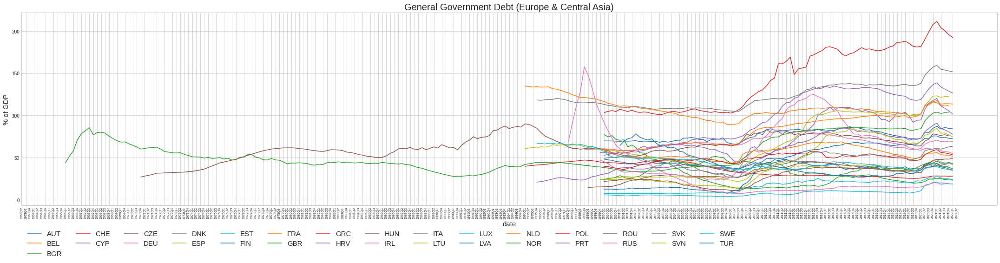

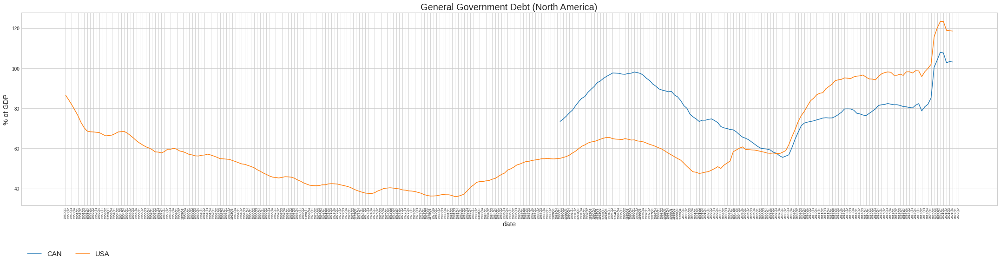

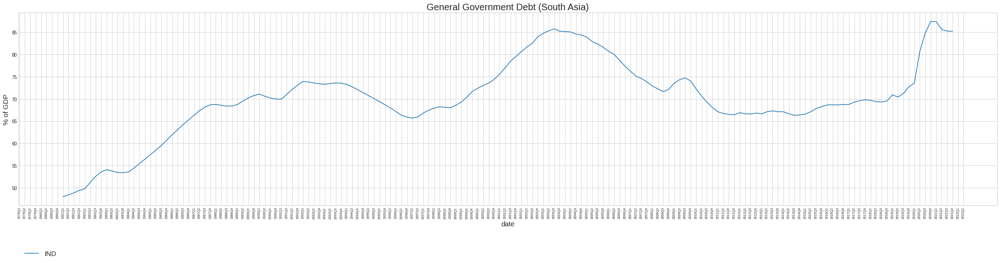

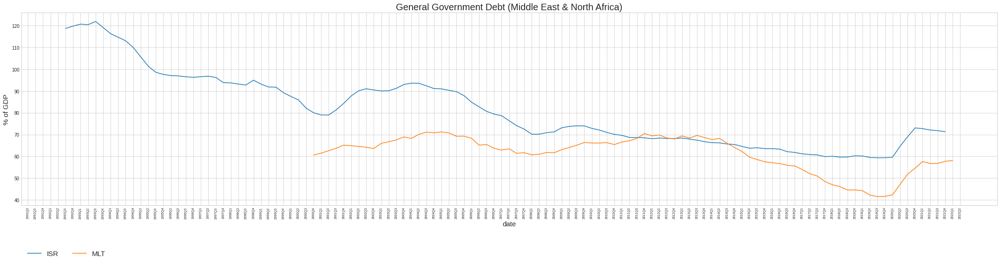

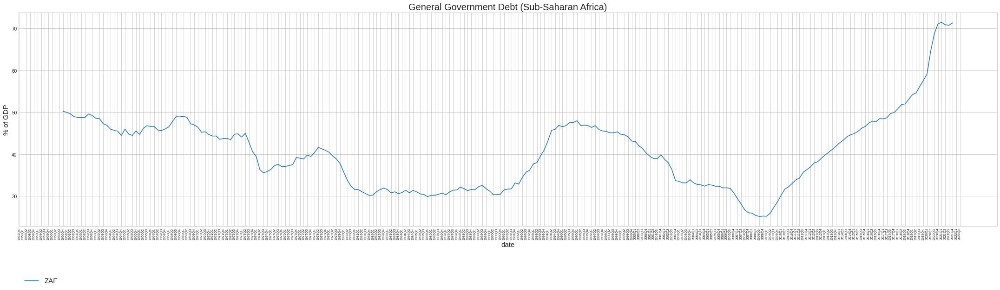

In [46]:
# ggdebt (region)

title_list = ['General Government Debt (Latin America & Caribbean)', 'General Government Debt (East Asia & Pacific)', 'General Government Debt (Europe & Central Asia)', 'General Government Debt (North America)', 'General Government Debt (South Asia)', 'General Government Debt (Middle East & North Africa)', 'General Government Debt (Sub-Saharan Africa)']

for i in range(1, 8):

    globals()['cond_region{}'.format(i)] = (data['region'] == data['region'].unique()[i-1])
    globals()['data_region{}'.format(i)] = data.loc[globals()['cond_region{}'.format(i)]]
    
    globals()['region{}_list'.format(i)] = list(globals()['data_region{}'.format(i)]['isocode'].unique())

    plt.figure(figsize=(30, 49)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['region'].unique().shape[0], 1, i)
    plt.title(title_list[i-1], fontsize=20)

    for j in range(0, len(globals()['region{}_list'.format(i)])):
  
        globals()['cond_region{}'.format(i) + '_isocode{}'.format(j+1)] = (data['isocode'] == globals()['region{}_list'.format(i)][j])
        globals()['data_region{}'.format(i) + '_isocode{}'.format(j+1)] = data.loc[globals()['cond_region{}'.format(i) + '_isocode{}'.format(j+1)]]

        plt.plot(globals()['data_region{}'.format(i) + '_isocode{}'.format(j+1)]['quarter'], globals()['data_region{}'.format(i) + '_isocode{}'.format(j+1)]['ggdebt'], label=globals()['data_region{}'.format(i) + '_isocode{}'.format(j+1)]['isocode'].unique()[0])
        plt.xlabel('date', fontsize=15)
        plt.ylabel('% of GDP', fontsize=15)
        plt.xticks(rotation=90, fontsize=7)
        plt.legend(loc='lower left', ncol=15, bbox_to_anchor=(0.0, -0.3), fontsize=15)

    plt.tight_layout()
    # plt.grid()

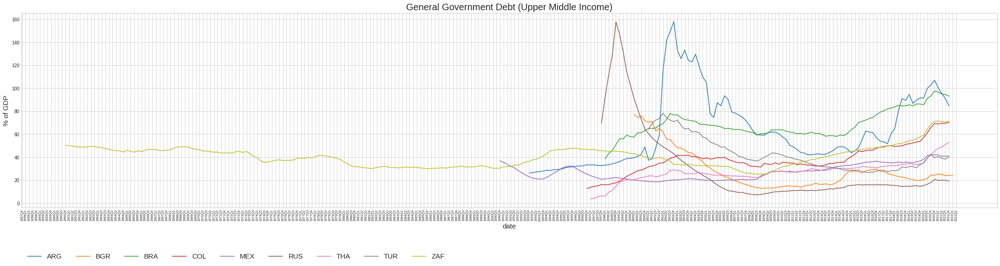

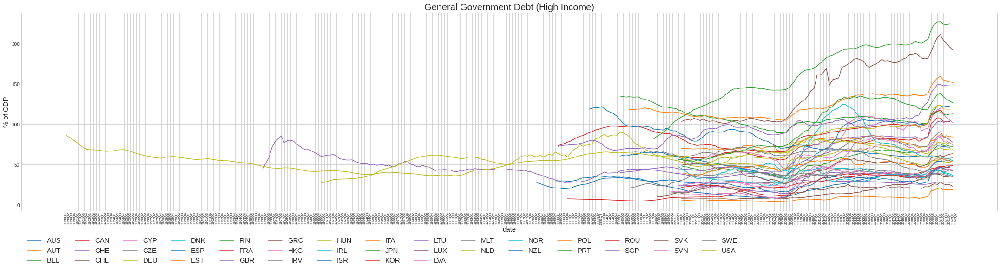

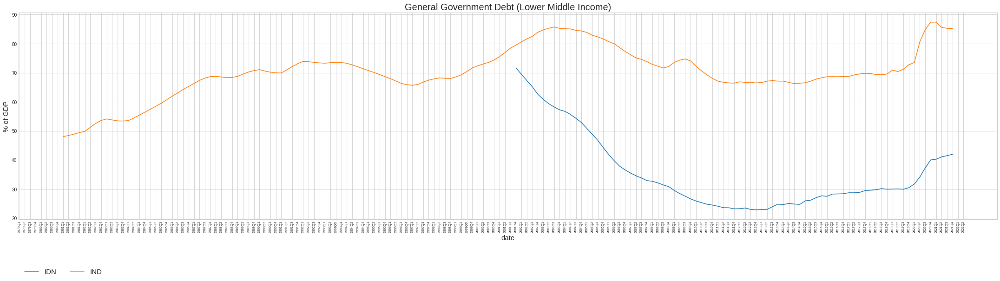

In [47]:
# ggdebt (income)

title_list = ['General Government Debt (Upper Middle Income)', 'General Government Debt (High Income)', 'General Government Debt (Lower Middle Income)']

for i in range(1, 4):

    globals()['cond_income{}'.format(i)] = (data['income'] == data['income'].unique()[i-1])
    globals()['data_income{}'.format(i)] = data.loc[globals()['cond_income{}'.format(i)]]
    
    globals()['income{}_list'.format(i)] = list(globals()['data_income{}'.format(i)]['isocode'].unique())

    plt.figure(figsize=(30, 21)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['income'].unique().shape[0], 1, i)
    plt.title(title_list[i-1], fontsize=20)

    for j in range(0, len(globals()['income{}_list'.format(i)])):
  
        globals()['cond_income{}'.format(i) + '_isocode{}'.format(j+1)] = (data['isocode'] == globals()['income{}_list'.format(i)][j])
        globals()['data_income{}'.format(i) + '_isocode{}'.format(j+1)] = data.loc[globals()['cond_income{}'.format(i) + '_isocode{}'.format(j+1)]]

        plt.plot(globals()['data_income{}'.format(i) + '_isocode{}'.format(j+1)]['quarter'], globals()['data_income{}'.format(i) + '_isocode{}'.format(j+1)]['ggdebt'], label=globals()['data_income{}'.format(i) + '_isocode{}'.format(j+1)]['isocode'].unique()[0])
        plt.xlabel('date', fontsize=15)
        plt.ylabel('% of GDP', fontsize=15)
        plt.xticks(rotation=90, fontsize=7)
        plt.legend(loc='lower left', ncol=15, bbox_to_anchor=(0.0, -0.3), fontsize=15)

    plt.tight_layout()
    # plt.grid()

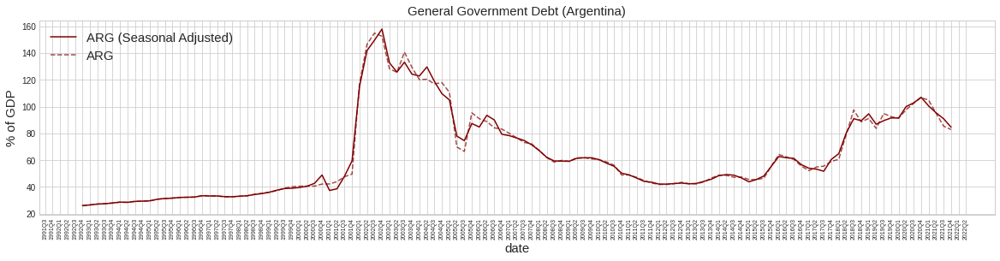

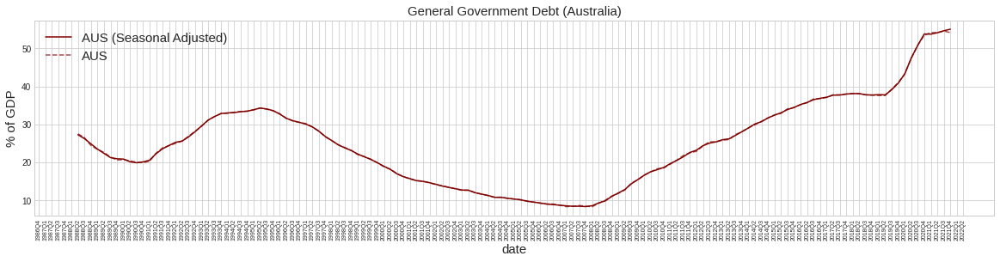

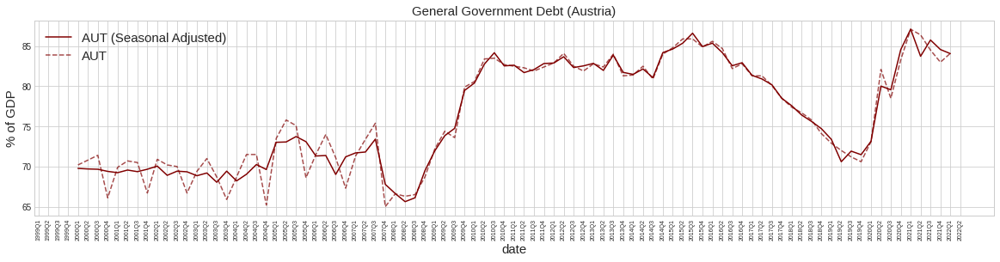

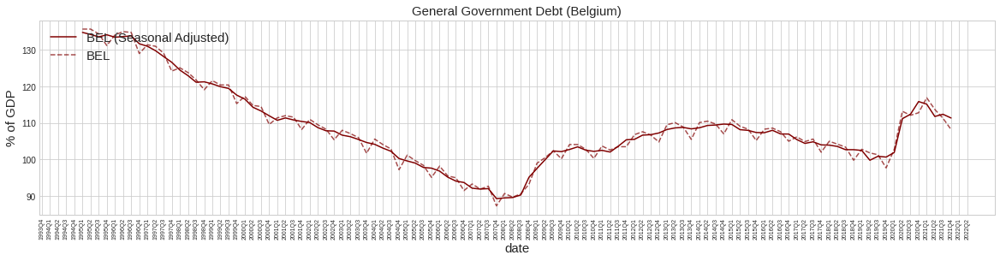

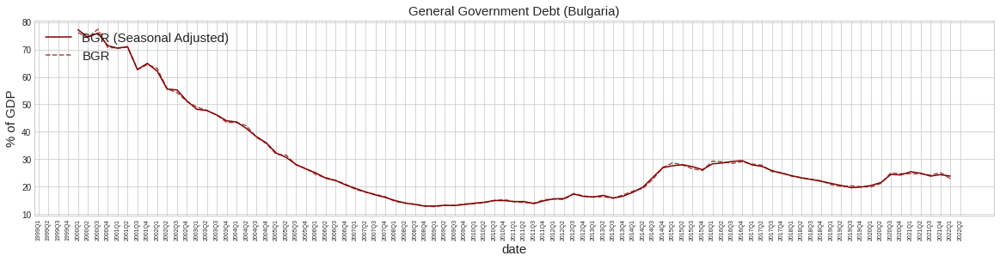

...

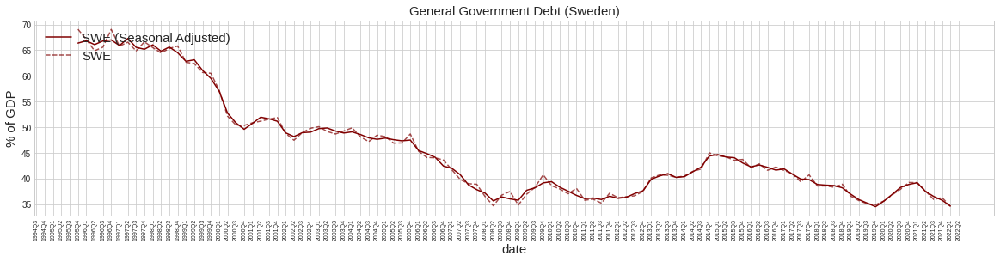

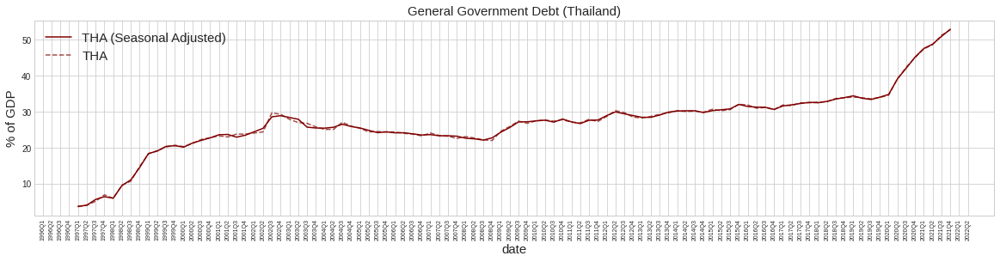

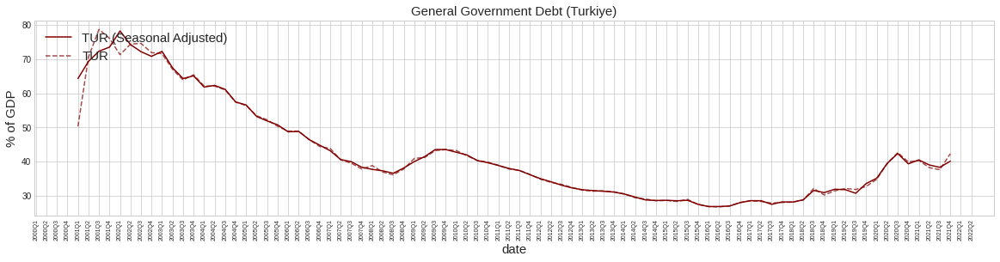

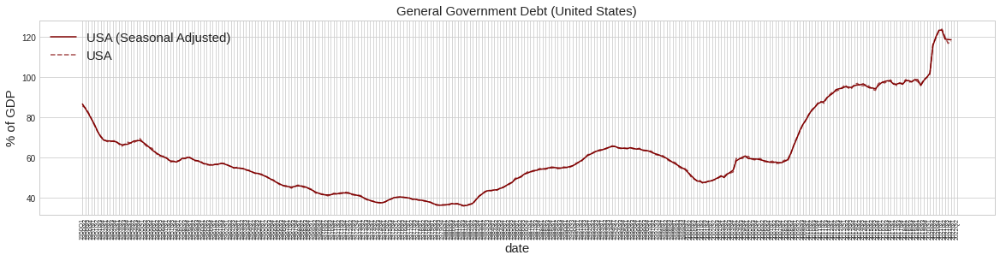

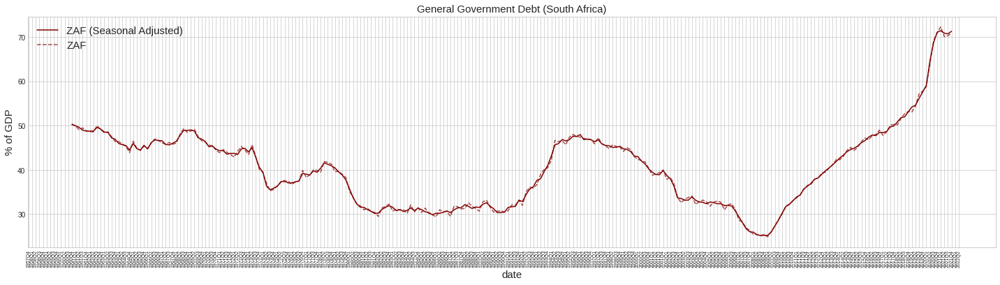

In [48]:
# ggdebt

warnings.filterwarnings(action='ignore')

for i in range(0, data['isocode'].unique().shape[0]):

    plt.figure(figsize=(20, 250)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['isocode'].unique().shape[0], 1, i+1)
    plt.title('General Government Debt ({})'.format(data['country'].unique()[i]), fontsize=15)
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_isocode{}'.format(i+1)]['quarter'], globals()['data_isocode{}'.format(i+1)]['ggdebt'], label=globals()['data_isocode{}'.format(i+1)]['isocode'].unique()[0] + ' (Seasonal Adjusted)', color='maroon')

    globals()['cond_temp_isocode{}'.format(i+1)] = (data_temp['isocode'] == data_temp['isocode'].unique()[i])
    globals()['data_temp_isocode{}'.format(i+1)] = data_temp.loc[globals()['cond_temp_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_temp_isocode{}'.format(i+1)]['quarter'], globals()['data_temp_isocode{}'.format(i+1)]['ggdebt'], label=globals()['data_temp_isocode{}'.format(i+1)]['isocode'].unique()[0], color='maroon', linestyle='dashed', alpha=0.7)

    plt.xlabel('date', fontsize=15)
    plt.ylabel('% of GDP', fontsize=15)
    plt.xticks(rotation=90, fontsize=7)
    plt.legend(loc='upper left', ncol=1, fontsize=15)

plt.tight_layout()
# plt.grid()

### **3.2. ggcon** <br/>

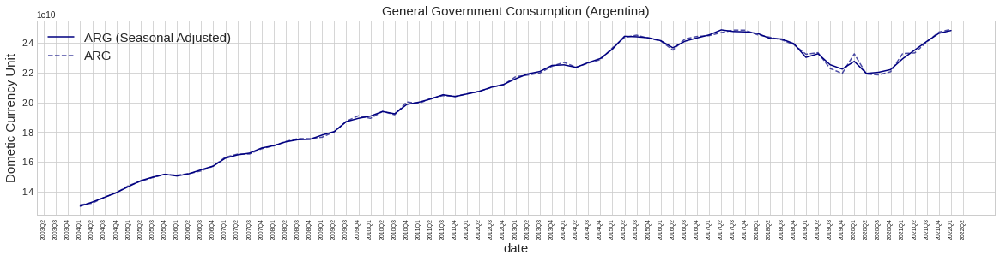

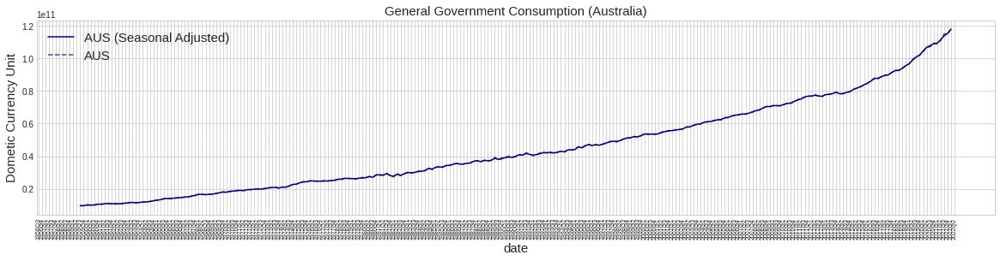

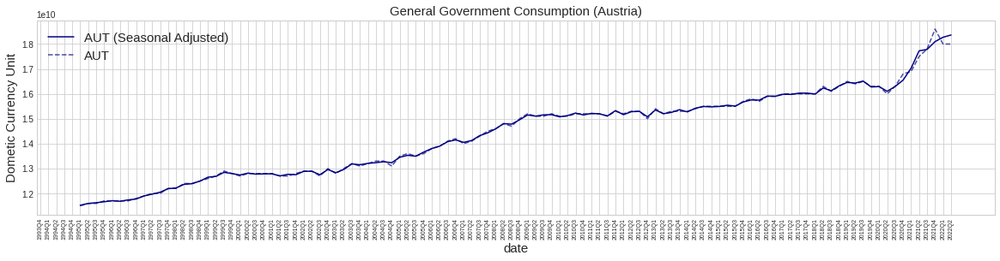

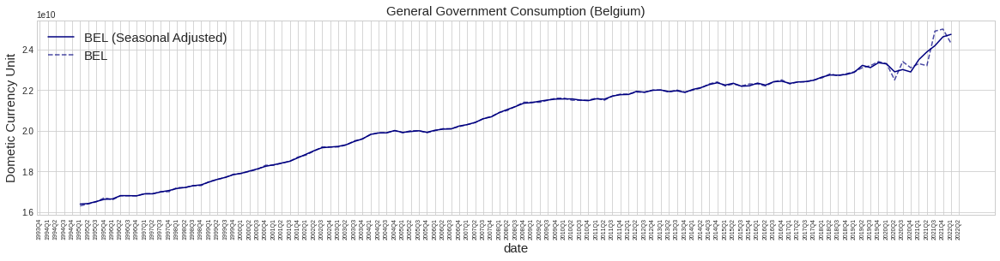

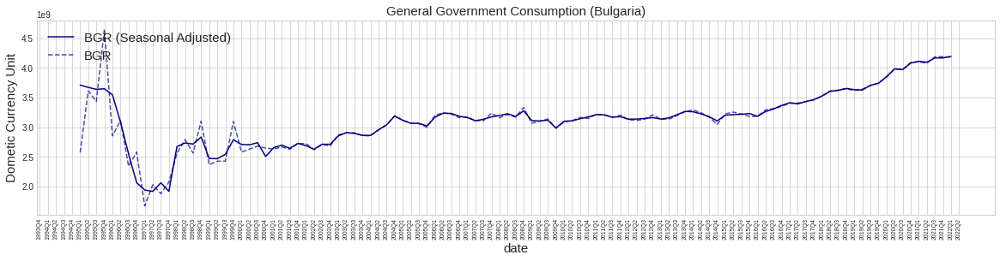

...

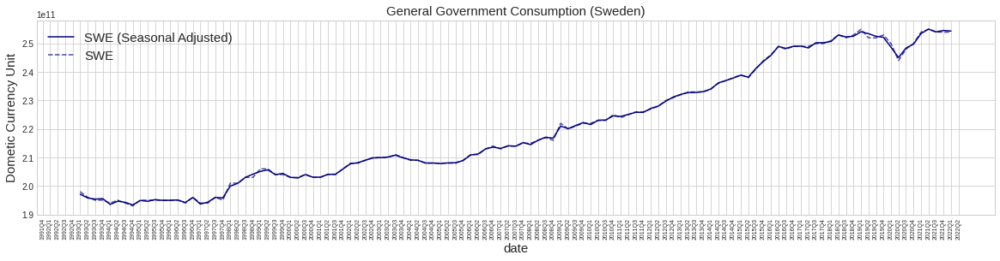

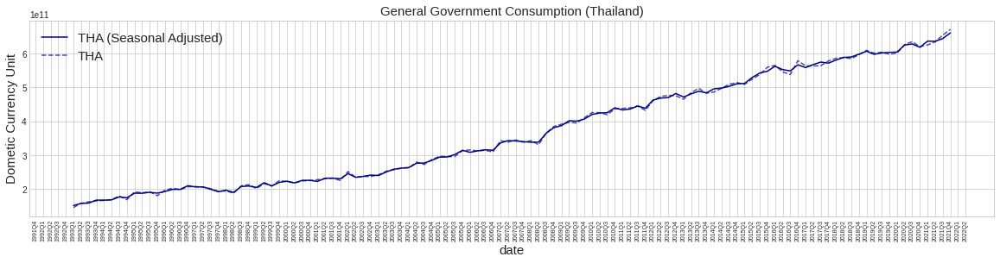

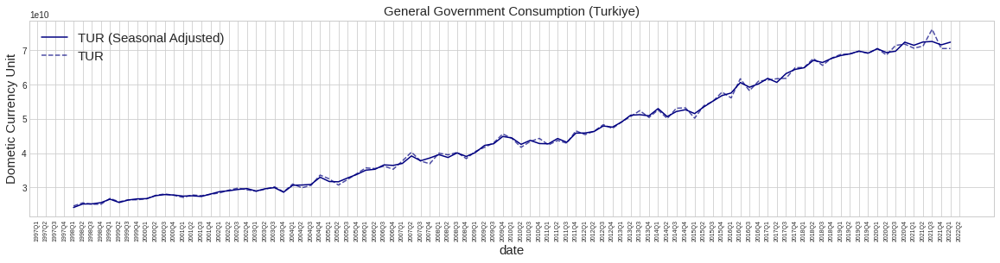

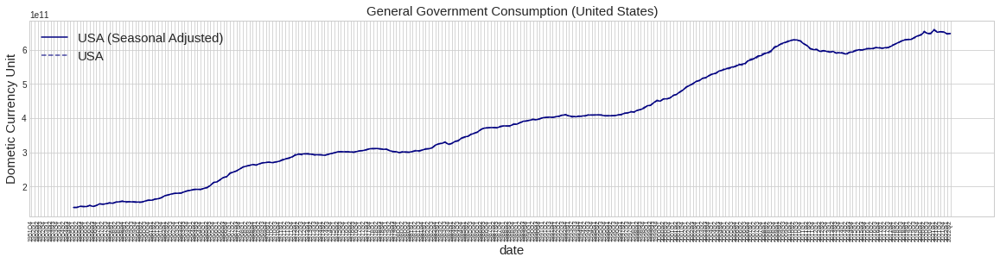

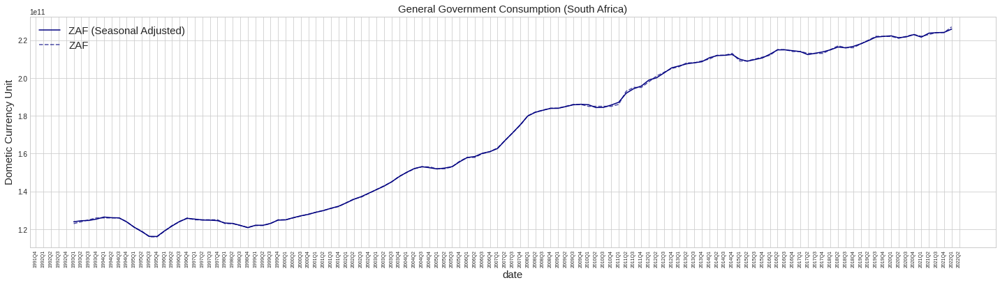

In [49]:
# ggcon

warnings.filterwarnings(action='ignore')

for i in range(0, data['isocode'].unique().shape[0]):

    plt.figure(figsize=(20, 250)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['isocode'].unique().shape[0], 1, i+1)
    plt.title('General Government Consumption ({})'.format(data['country'].unique()[i]), fontsize=15)
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_isocode{}'.format(i+1)]['quarter'], globals()['data_isocode{}'.format(i+1)]['ggcon'], label=globals()['data_isocode{}'.format(i+1)]['isocode'].unique()[0] + ' (Seasonal Adjusted)', color='navy')
    
    globals()['cond_temp_isocode{}'.format(i+1)] = (data_temp['isocode'] == data_temp['isocode'].unique()[i])
    globals()['data_temp_isocode{}'.format(i+1)] = data_temp.loc[globals()['cond_temp_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_temp_isocode{}'.format(i+1)]['quarter'], globals()['data_temp_isocode{}'.format(i+1)]['ggcon'], label=globals()['data_temp_isocode{}'.format(i+1)]['isocode'].unique()[0], color='navy', linestyle='dashed', alpha=0.7)
    
    plt.xlabel('date', fontsize=15)
    plt.ylabel('Dometic Currency Unit', fontsize=15)
    plt.xticks(rotation=90, fontsize=7)
    plt.legend(loc='upper left', ncol=1, fontsize=15)

plt.tight_layout()
# plt.grid()

### **3.3. gdp** <br/>

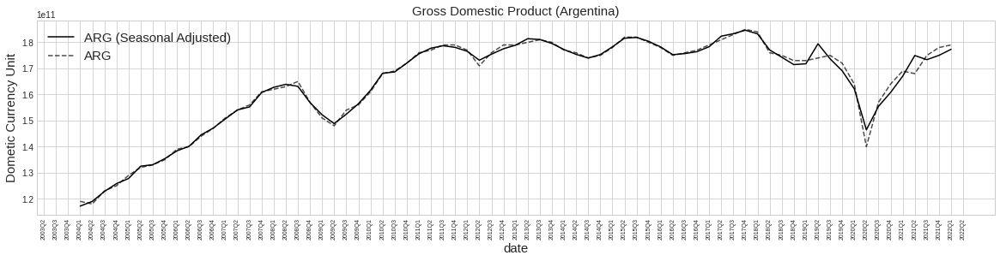

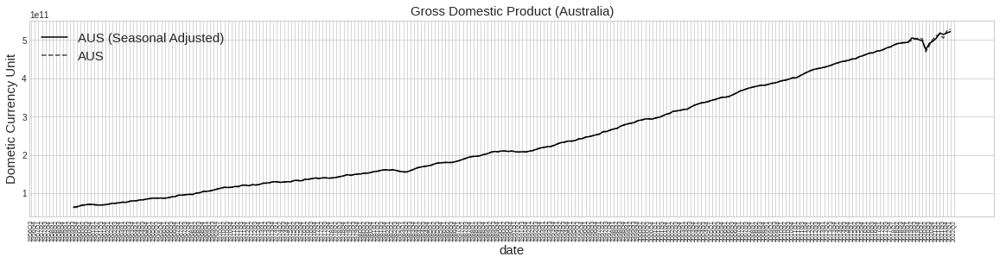

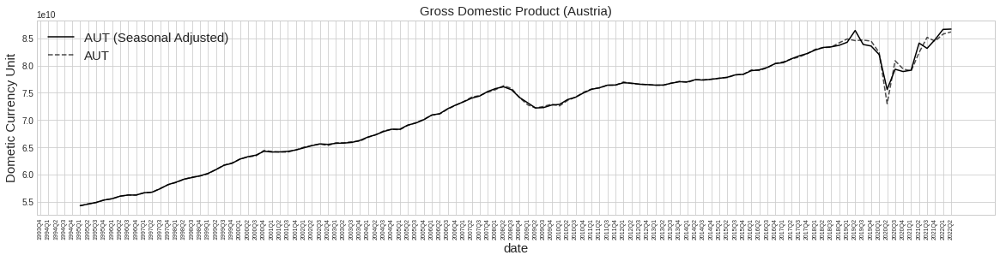

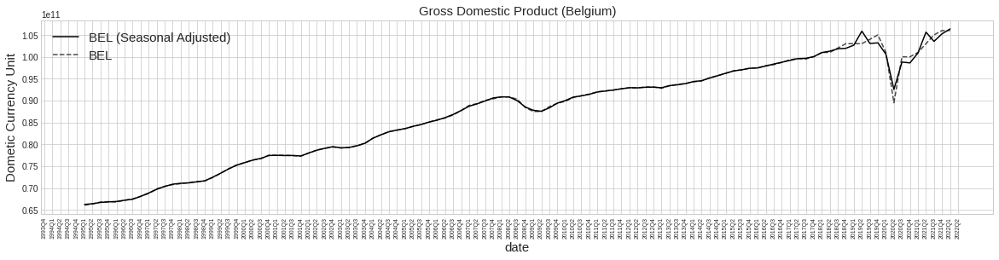

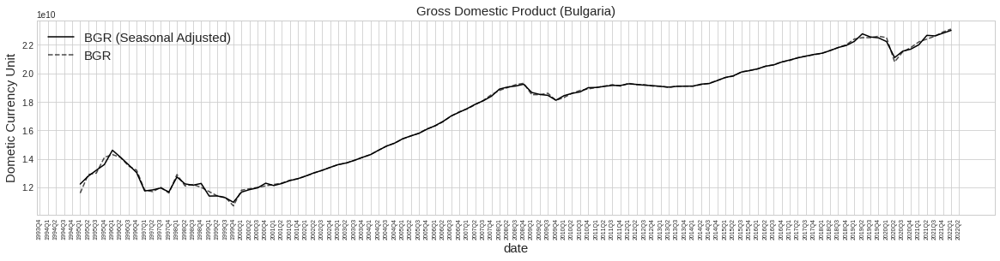

...

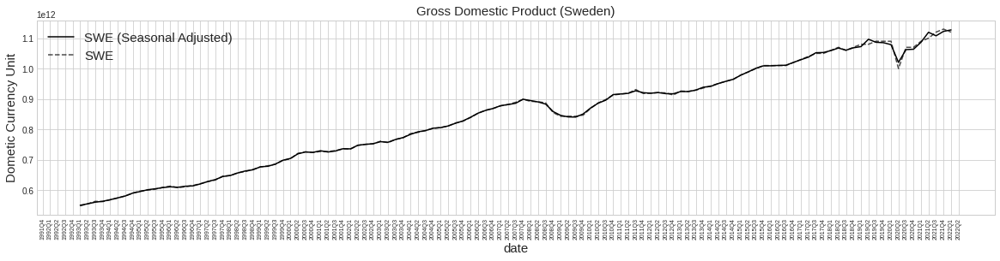

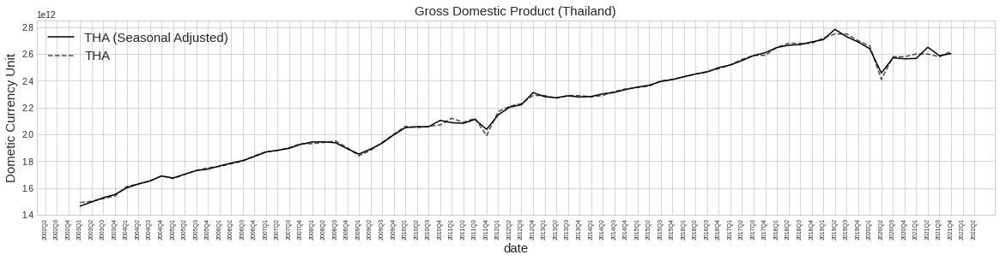

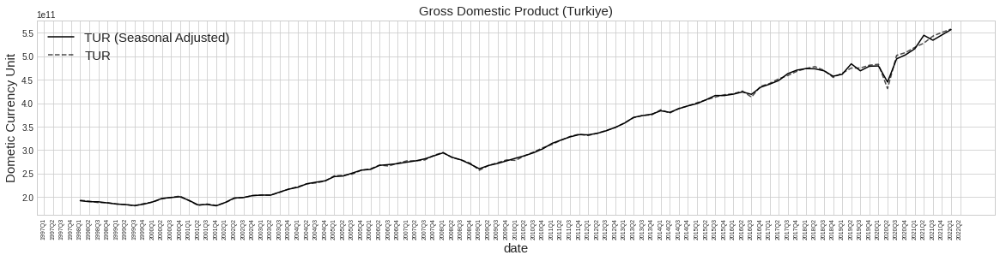

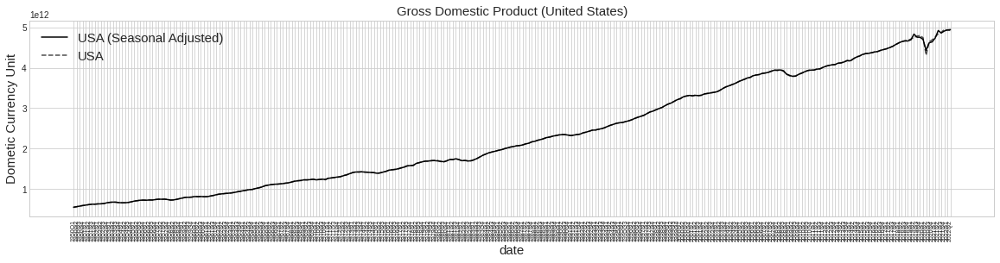

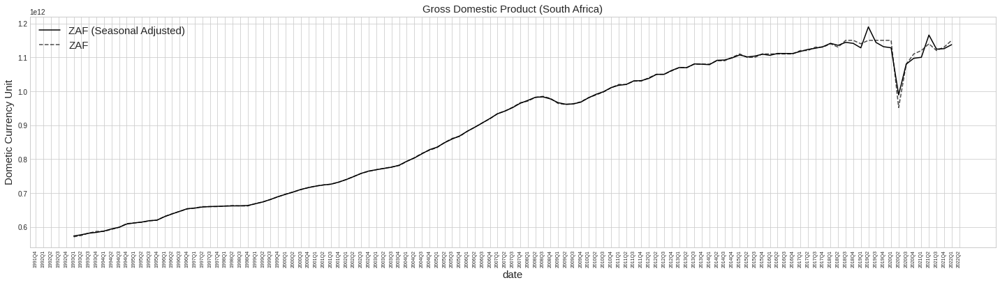

In [50]:
# gdp

warnings.filterwarnings(action='ignore')

for i in range(0, data['isocode'].unique().shape[0]):

    plt.figure(figsize=(20, 250)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['isocode'].unique().shape[0], 1, i+1)
    plt.title('Gross Domestic Product ({})'.format(data['country'].unique()[i]), fontsize=15)
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_isocode{}'.format(i+1)]['quarter'], globals()['data_isocode{}'.format(i+1)]['gdp'], label=globals()['data_isocode{}'.format(i+1)]['isocode'].unique()[0] + ' (Seasonal Adjusted)', color='black')
    
    globals()['cond_temp_isocode{}'.format(i+1)] = (data_temp['isocode'] == data_temp['isocode'].unique()[i])
    globals()['data_temp_isocode{}'.format(i+1)] = data_temp.loc[globals()['cond_temp_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_temp_isocode{}'.format(i+1)]['quarter'], globals()['data_temp_isocode{}'.format(i+1)]['gdp'], label=globals()['data_temp_isocode{}'.format(i+1)]['isocode'].unique()[0], color='black', linestyle='dashed', alpha=0.7)
    
    plt.xlabel('date', fontsize=15)
    plt.ylabel('Dometic Currency Unit', fontsize=15)
    plt.xticks(rotation=90, fontsize=7)
    plt.legend(loc='upper left', ncol=1, fontsize=15)

plt.tight_layout()
# plt.grid()

### **3.4. reer** <br/>

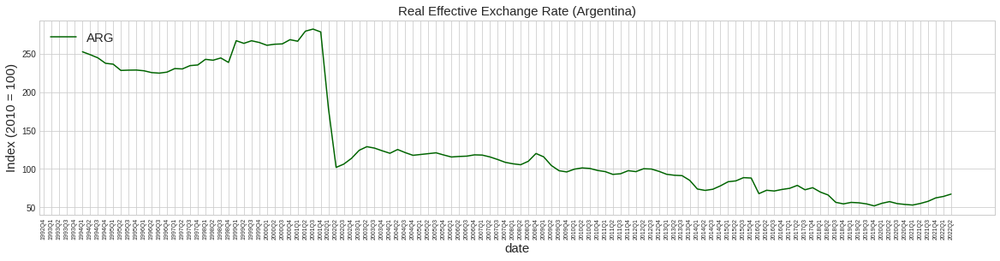

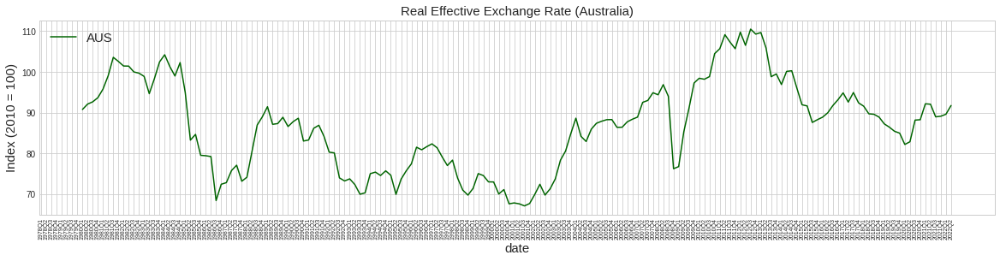

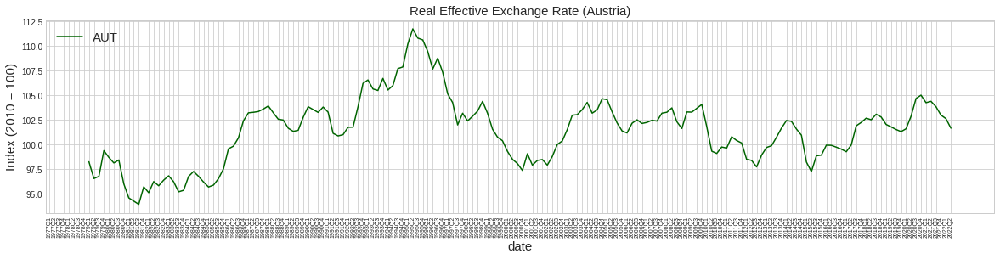

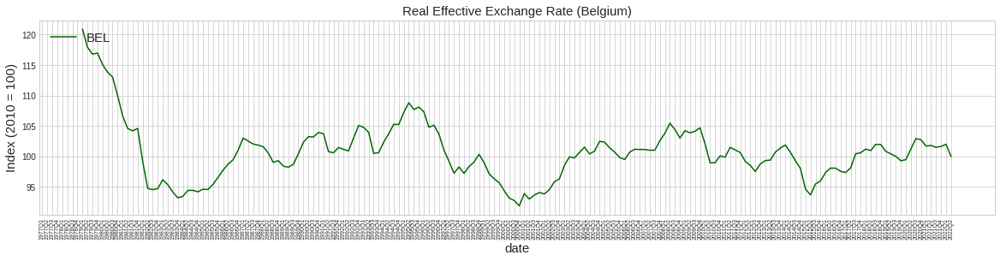

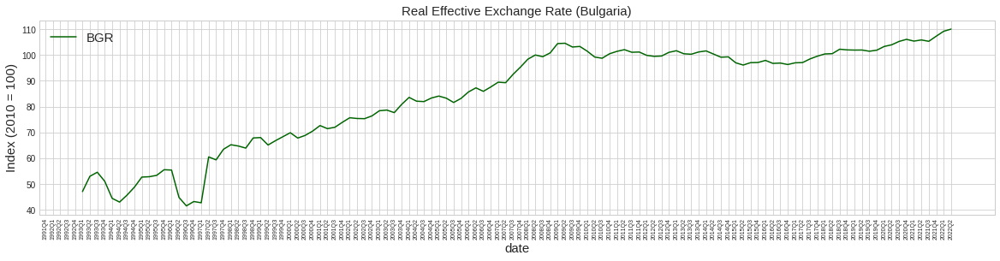

...

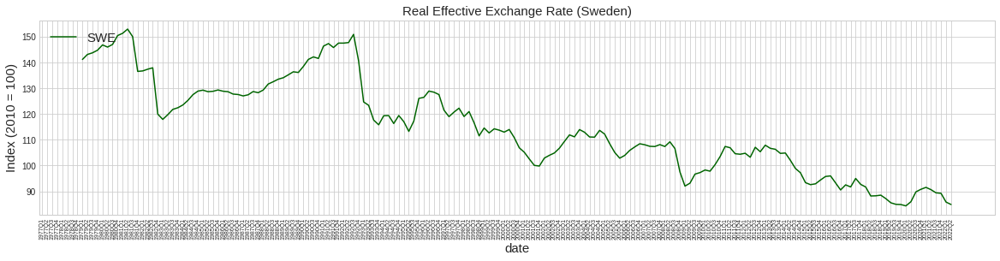

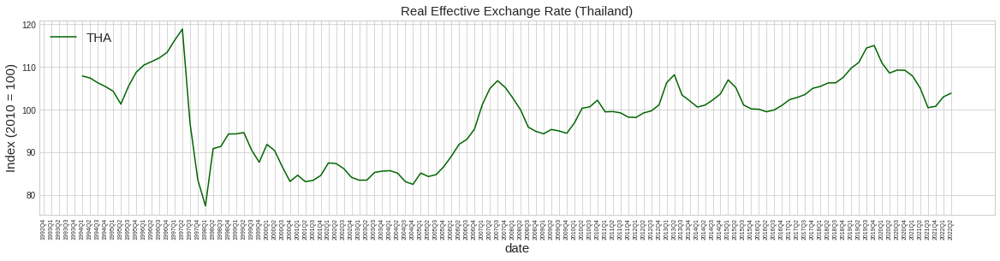

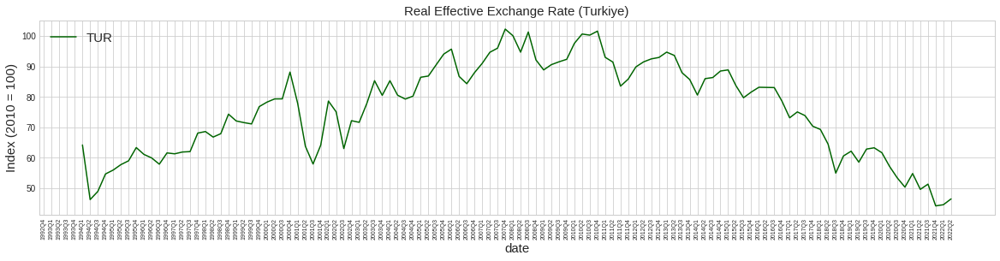

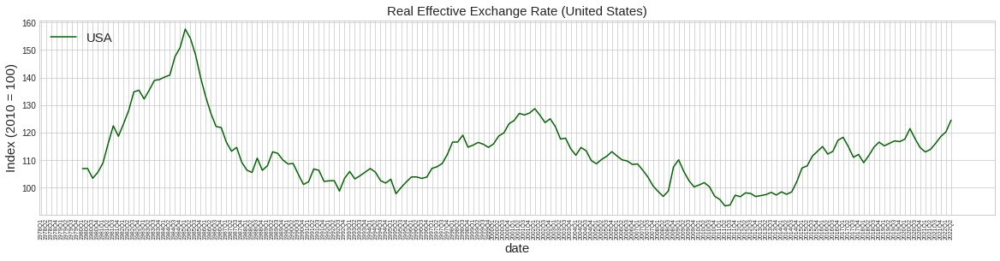

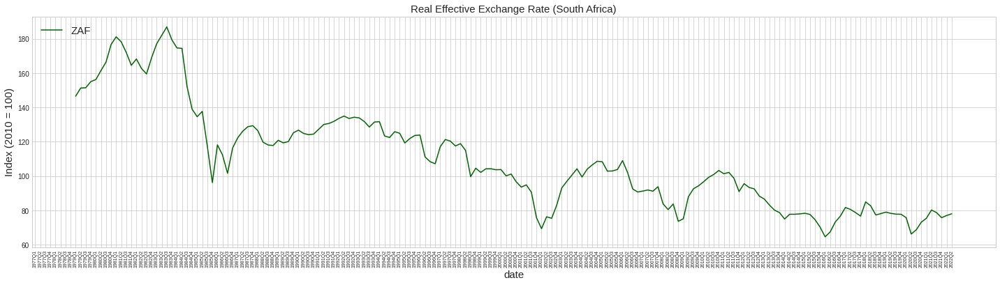

In [51]:
# reer

warnings.filterwarnings(action='ignore')

for i in range(0, data['isocode'].unique().shape[0]):

    plt.figure(figsize=(20, 250)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['isocode'].unique().shape[0], 1, i+1)
    plt.title('Real Effective Exchange Rate ({})'.format(data['country'].unique()[i]), fontsize=15)
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_isocode{}'.format(i+1)]['quarter'], globals()['data_isocode{}'.format(i+1)]['reer'], label=globals()['data_isocode{}'.format(i+1)]['isocode'].unique()[0], color='darkgreen')
    plt.xlabel('date', fontsize=15)
    plt.ylabel('Index (2010 = 100)', fontsize=15)
    plt.xticks(rotation=90, fontsize=7)
    plt.legend(loc='upper left', ncol=1, fontsize=15)

plt.tight_layout()
# plt.grid()

### **3.5. ca** <br/>

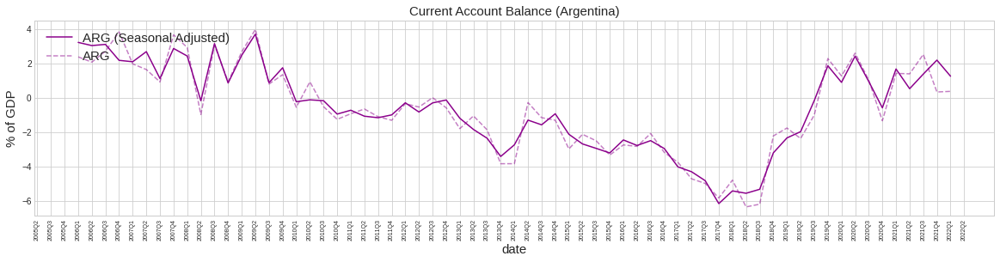

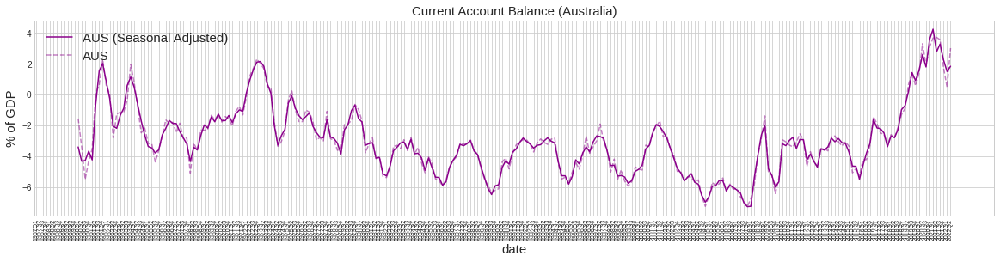

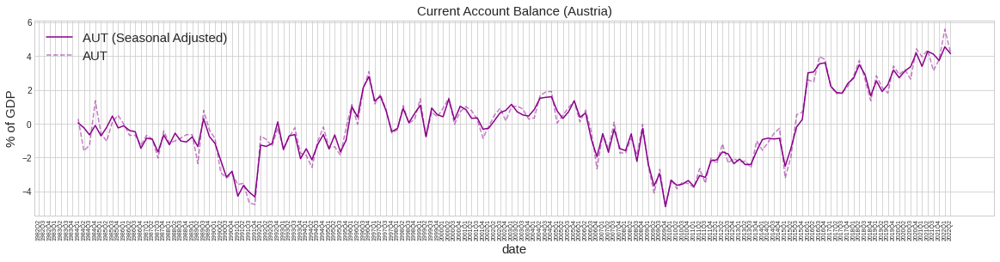

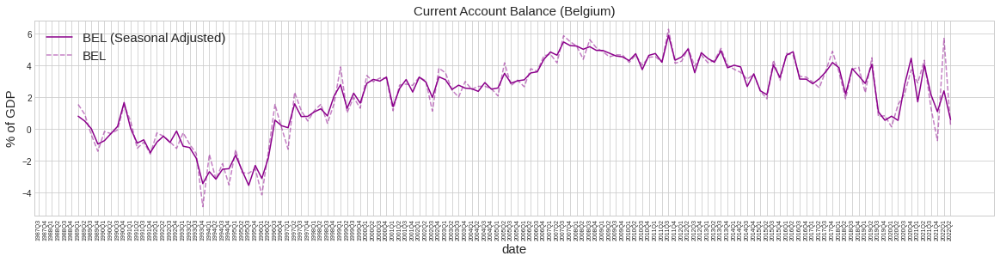

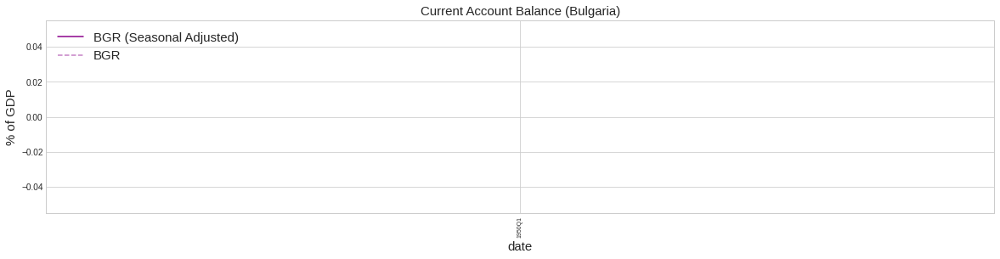

...

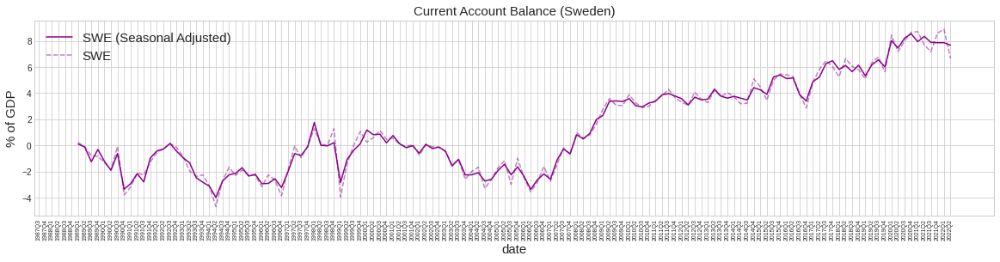

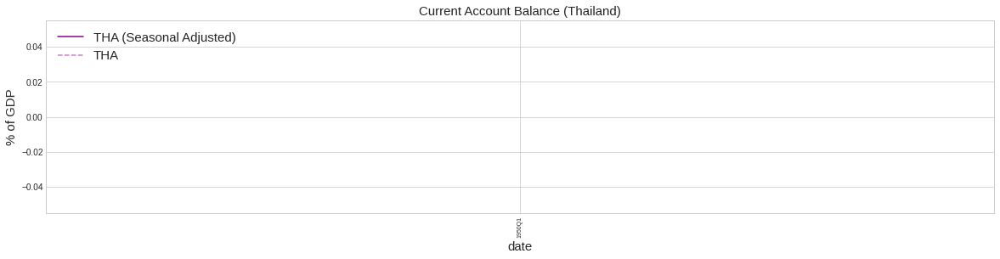

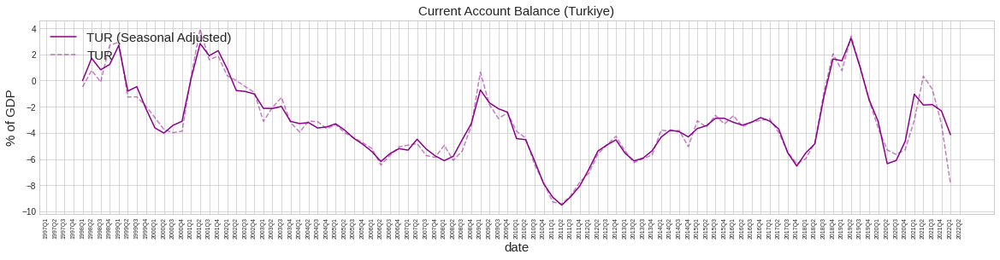

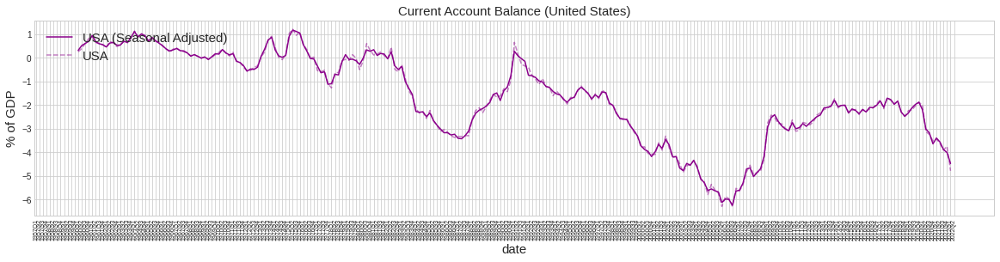

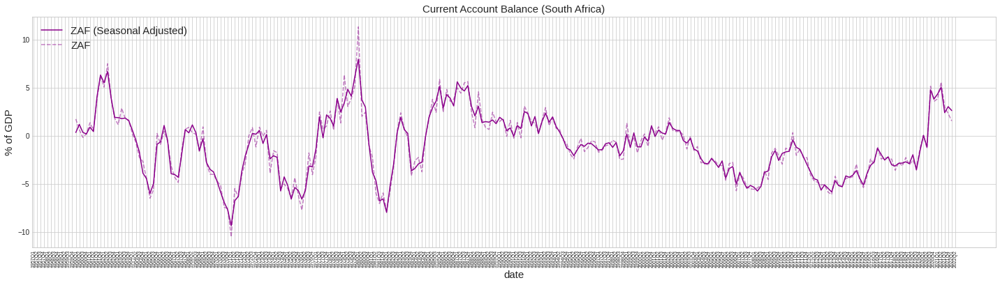

In [52]:
# ca

for i in range(0, data['isocode'].unique().shape[0]):

    plt.figure(figsize=(20, 250)).set_facecolor('white')
    plt.style.use('seaborn-whitegrid')

    plt.subplot(data['isocode'].unique().shape[0], 1, i+1)
    plt.title('Current Account Balance ({})'.format(data['country'].unique()[i]), fontsize=15)
  
    globals()['cond_isocode{}'.format(i+1)] = (data['isocode'] == data['isocode'].unique()[i])
    globals()['data_isocode{}'.format(i+1)] = data.loc[globals()['cond_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_isocode{}'.format(i+1)]['quarter'], globals()['data_isocode{}'.format(i+1)]['ca'], label=globals()['data_isocode{}'.format(i+1)]['isocode'].unique()[0] + ' (Seasonal Adjusted)', color='darkmagenta')
    
    globals()['cond_temp_isocode{}'.format(i+1)] = (data_temp['isocode'] == data_temp['isocode'].unique()[i])
    globals()['data_temp_isocode{}'.format(i+1)] = data_temp.loc[globals()['cond_temp_isocode{}'.format(i+1)]]

    plt.plot(globals()['data_temp_isocode{}'.format(i+1)]['quarter'], globals()['data_temp_isocode{}'.format(i+1)]['ca'], label=globals()['data_temp_isocode{}'.format(i+1)]['isocode'].unique()[0], color='darkmagenta', linestyle='dashed', alpha=0.5)
    
    plt.xlabel('date', fontsize=15)
    plt.ylabel('% of GDP', fontsize=15)
    plt.xticks(rotation=90, fontsize=7)
    plt.legend(loc='upper left', ncol=1, fontsize=15)

plt.tight_layout()
# plt.grid()

## **4. export the data**

In [53]:
# quarterly panel data

data.to_excel(excel_writer='data.xlsx')

## **5. references**

* https://data.oecd.org/ <br/>
* https://stats.bis.org/#ppq=XRU_D_24D;pv=1,2~4~1,0,0~both <br/>
* https://databank.worldbank.org/source/world-development-indicators/preview/on <br/>
* https://wits.worldbank.org/wits/wits/witshelp/content/codes/country_codes.htm <br/>
* https://ec.europa.eu/eurostat/en/web/main/data/database <br/>
* https://data.imf.org/?sk=4c514d48-b6ba-49ed-8ab9-52b0c1a0179b&sId=1409151240976 <br/>
* https://fred.stlouisfed.org/ <br/>